Video spikes shape: (1, 64, 512)
Audio spikes shape: (1, 64, 72)
Fused spikes shape: (1, 64, 584)
🔥 Overall firing rate: 30.50% active spikes


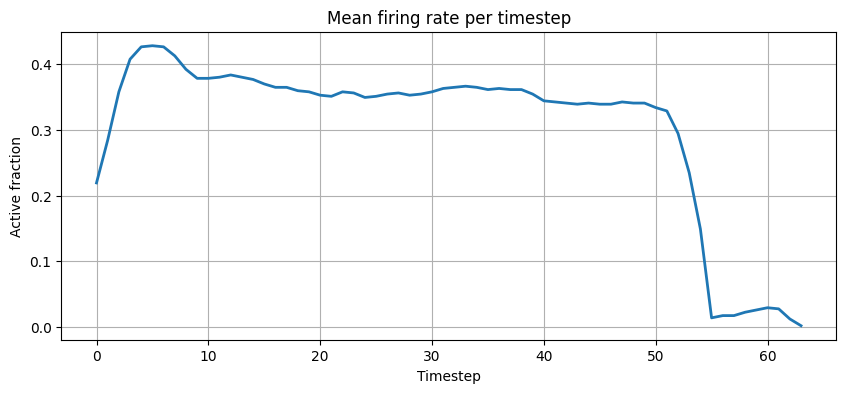

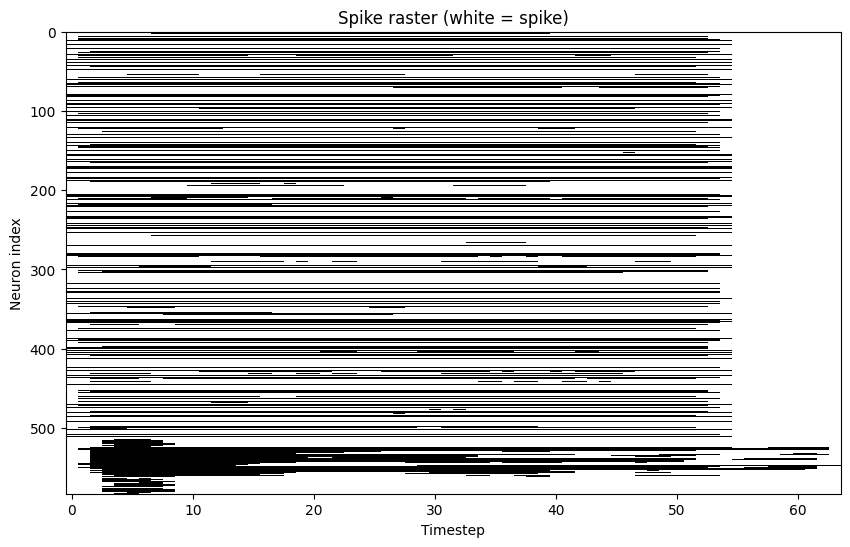

In [1]:
# --- Imports ---
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# --- Load one fused file ---
npz_path = Path("spike_features/angry/angry_00001_fusion.npz")
data = np.load(npz_path, allow_pickle=True)

# --- Extract arrays ---
video_spikes = data["video_embeddings"]  # shape: [B, T, F_v] or [1, T, F_v]
audio_spikes = data["audio_mel"]         # shape: [B, T, F_a] or [1, T, F_a]
fused_spikes  = data["fused"]            # shape: [B, T, F_v + F_a]

print(f"Video spikes shape: {video_spikes.shape}")
print(f"Audio spikes shape: {audio_spikes.shape}")
print(f"Fused spikes shape: {fused_spikes.shape}")

# --- Convert to 2D for visualization ---
# remove batch dimension if present
if fused_spikes.ndim == 3 and fused_spikes.shape[0] == 1:
    fused_spikes = fused_spikes[0]

# --- Compute basic firing statistics ---
total_spikes = fused_spikes.sum()
total_neurons = fused_spikes.size
firing_rate = total_spikes / total_neurons

print(f"🔥 Overall firing rate: {firing_rate*100:.2f}% active spikes")

# --- Compute per-timestep firing rate ---
timestep_rate = fused_spikes.mean(axis=1)

plt.figure(figsize=(10, 4))
plt.plot(timestep_rate, linewidth=2)
plt.title("Mean firing rate per timestep")
plt.xlabel("Timestep")
plt.ylabel("Active fraction")
plt.grid(True)
plt.show()

# --- Raster plot (binary spike visualization) ---
plt.figure(figsize=(10, 6))
plt.imshow(fused_spikes.T, aspect="auto", cmap="Greys", interpolation="nearest")
plt.title("Spike raster (white = spike)")
plt.xlabel("Timestep")
plt.ylabel("Neuron index")
plt.show()


Video spikes shape: (1, 64, 512)
Audio spikes shape: (1, 64, 72)
Fused spikes shape: (1, 64, 584)
🔥 Overall firing rate: 30.50%
Timesteps: 64, Neurons: 584


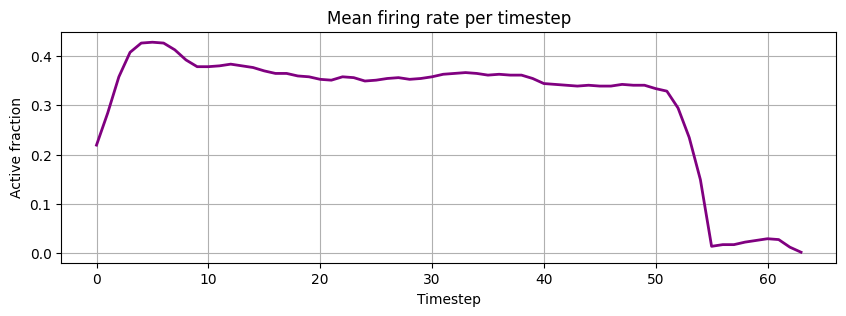

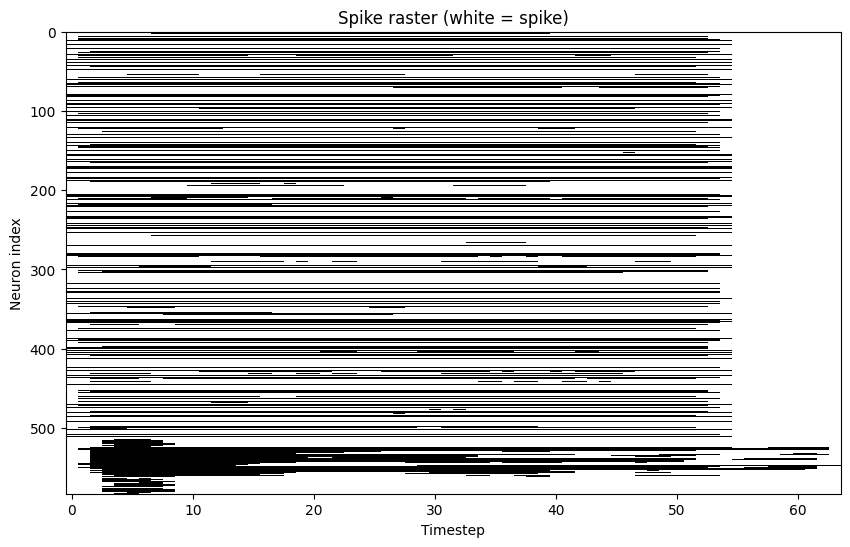

In [5]:
# --- Imports ---
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from pathlib import Path
from IPython.display import HTML

# --- Load one fused file ---
npz_path = Path("spike_features/angry/angry_00001_fusion.npz")
data = np.load(npz_path, allow_pickle=True)

# --- Extract arrays ---
video_spikes = data["video_embeddings"]
audio_spikes = data["audio_mel"]
fused_spikes = data["fused"]

print(f"Video spikes shape: {video_spikes.shape}")
print(f"Audio spikes shape: {audio_spikes.shape}")
print(f"Fused spikes shape: {fused_spikes.shape}")

# --- Prepare arrays ---
if fused_spikes.ndim == 3 and fused_spikes.shape[0] == 1:
    fused_spikes = fused_spikes[0]

T, N = fused_spikes.shape  # timesteps × neurons

# --- Stats ---
print(f"🔥 Overall firing rate: {fused_spikes.mean()*100:.2f}%")
print(f"Timesteps: {T}, Neurons: {N}")

# --- Mean firing rate per timestep ---
plt.figure(figsize=(10, 3))
plt.plot(fused_spikes.mean(axis=1), linewidth=2, color="purple")
plt.title("Mean firing rate per timestep")
plt.xlabel("Timestep")
plt.ylabel("Active fraction")
plt.grid(True)
plt.show()

# --- Raster plot ---
plt.figure(figsize=(10, 6))
plt.imshow(fused_spikes.T, aspect="auto", cmap="Greys", interpolation="nearest")
plt.title("Spike raster (white = spike)")
plt.xlabel("Timestep")
plt.ylabel("Neuron index")
plt.show()



In [8]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

T, N = fused_spikes.shape
neurons = np.arange(N)
spikes = fused_spikes / fused_spikes.max()

def update(frame):
    ax.cla()  # ✅ clear safely
    z_offset = frame * 0.05
    active = spikes[frame]
    active_idx = np.where(active > 0)[0]
    if len(active_idx) > 0:
        colors = plt.cm.plasma(active[active_idx])
        ax.scatter(
            active_idx,
            np.full_like(active_idx, frame),
            np.full_like(active_idx, z_offset),
            c=colors,
            s=10,
            alpha=0.8
        )
    ax.set_xlabel("Neuron Index")
    ax.set_ylabel("Timestep")
    ax.set_zlabel("Depth (Time)")
    ax.set_xlim(0, N)
    ax.set_ylim(0, T)
    ax.set_zlim(0, T * 0.05)
    ax.set_title(f"3D Spike Activity (Frame {frame+1}/{T})")
    return ax,

ani = FuncAnimation(fig, update, frames=range(T), interval=100, blit=False)
plt.close(fig)

HTML(ani.to_jshtml())


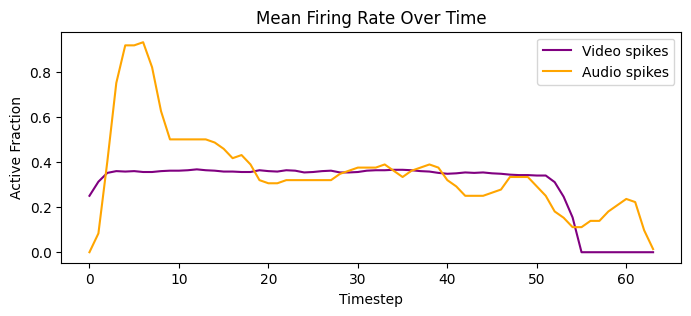

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from mpl_toolkits.mplot3d import Axes3D

# --- Load your .npz file ---
data = np.load("spike_features/angry/angry_00001_fusion.npz", allow_pickle=True)
video_spikes = data["video_embeddings"]
audio_spikes = data["audio_mel"]

# --- Prepare ---
T = video_spikes.shape[1]
Nv = video_spikes.shape[-1]
Na = audio_spikes.shape[-1]
video_spikes = video_spikes.squeeze()
audio_spikes = audio_spikes.squeeze()

# --- Normalize for visualization ---
video_spikes = video_spikes / (video_spikes.max() + 1e-8)
audio_spikes = audio_spikes / (audio_spikes.max() + 1e-8)

# --- 1️⃣ Mean firing rate comparison ---
plt.figure(figsize=(8, 3))
plt.plot(video_spikes.mean(axis=1), color='purple', label='Video spikes')
plt.plot(audio_spikes.mean(axis=1), color='orange', label='Audio spikes')
plt.title("Mean Firing Rate Over Time")
plt.xlabel("Timestep")
plt.ylabel("Active Fraction")
plt.legend()
plt.show()

# --- 2️⃣ 3D dual-modality spike animation ---
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

def update(frame):
    ax.cla()
    ax.set_title(f"Video (purple) vs Audio (orange) Spikes — Frame {frame+1}/{T}")
    ax.set_xlabel("Neuron Index")
    ax.set_ylabel("Timestep")
    ax.set_zlabel("Depth (Time)")
    ax.set_xlim(0, max(Nv, Na))
    ax.set_ylim(0, T)
    ax.set_zlim(0, T * 0.1)

    # --- Video spikes ---
    vid_active = np.where(video_spikes[frame] > 0)[0]
    if len(vid_active) > 0:
        ax.scatter(
            vid_active,
            np.full_like(vid_active, frame),
            np.full_like(vid_active, frame * 0.1 + 0.02),  # slight lift
            c='purple',
            s=8,
            alpha=0.7,
            label='Video'
        )

    # --- Audio spikes ---
    aud_active = np.where(audio_spikes[frame] > 0)[0]
    if len(aud_active) > 0:
        ax.scatter(
            aud_active,
            np.full_like(aud_active, frame),
            np.full_like(aud_active, frame * 0.1),  # below video layer
            c='orange',
            s=8,
            alpha=0.7,
            label='Audio'
        )

    # Add simple legend
    ax.text2D(0.05, 0.9, "Video = Purple\nAudio = Orange", transform=ax.transAxes)
    return ax,

ani = FuncAnimation(fig, update, frames=range(T), interval=100, blit=False)
plt.close(fig)

HTML(ani.to_jshtml())
